# <center> Spatial Clustering of Airbnb Listings in NY using Spark 👨🏻‍💻</center>

## <center>[Msc. Diego Hurtado](https://www.linkedin.com/in/diegohurtadoo/)</center>

<img src="https://github.com/DiegoHurtad0/DataSciencePortfolio/blob/main/Airbnb%20NYC%20Price%20Prediction/Spatial%20Clustering%20of%20Airbnb%20Listings%20in%20NY%20using%20Spark/figures/spatial_ny.png?raw=true" width="700" height="500">

# 1 <a id='1'>Introduction</a>
[Table of contents](#0.1)

The project "Spatial Clustering of Airbnb Listings in NY using Spark" aims to analyze and cluster Airbnb listings in New York City based on their geographical locations. This project leverages the power of Apache Spark for data processing and employs the k-means clustering algorithm to group listings with similar spatial characteristics. The ultimate goal is to gain insights into the distribution and organization of Airbnb properties across the city, which can aid in understanding market dynamics and making informed investment decisions.

The project begins with data preprocessing, where the dataset is cleaned and transformed into a suitable format for further analysis. Next, the optimal number of clusters is determined using the elbow method and silhouette scores. These evaluation metrics help assess the quality of the clustering and ensure that the chosen number of clusters best represents the underlying spatial structure of the data.

Once the optimal number of clusters has been selected, the k-means algorithm is applied to the data, and the resulting clusters are visualized using scatter plots and interactive maps. Visualization libraries such as Matplotlib, Seaborn, and Plotly are employed to create clear and informative graphics that demonstrate the spatial distribution of Airbnb listings.

By analyzing the spatial clustering of Airbnb listings in New York City, the project aims to uncover patterns and trends in the Airbnb market. This information can be valuable for property owners, investors, and city planners, as it can help identify areas with high demand, inform pricing strategies, and guide future development efforts.

# Table of Contents Diego 👨🏻‍💻<a id='0.1'></a>

* [Introduction](#1)
* [Data Modeling ](#2)
    * [Import Packages](#2.1)
    * [Custom Classes](#2.2)
    * [Data Preprocessing](#2.3)
        * [Data Reading](#2.3.1)
        * [Data Cleaning](#2.3.2)
        * [feature engineering](#2.3.3)
        * [Basic EDA](#2.3.4)
    * [Data Preprocessing](#2.4)
        * [LSTMClassifier](#2.4.1)
        * [Data Cleaning](#2.4.2)
        * [Evaluate](#2.4.3)
        * [LSTM Prediction](#2.4.4)
        * [Feature importance](#2.4.5)
        * [Save LSTM Model](#2.4.6)

# 2 <a id='2'> Data Modeling 📚</a>
[Table of contents](#0.1)

# 2.1 <a id='2.1'>Import Packages📚</a>
[Table of contents](#0.1)

In [1]:
import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import silhouette_score

# spark entry point
from pyspark import SparkContext
from pyspark.ml.clustering import KMeans
from pyspark.ml.feature import VectorAssembler
# get case count by hour
from pyspark.sql.functions import hour

from pyspark.sql import SQLContext, SparkSession
from pyspark.sql.functions import to_timestamp
# spark schema utils
from pyspark.sql.types import *
from pyspark.sql.functions import col, hour, dayofmonth, minute
from pyspark.sql.functions import col, count, when, isnan, isnull
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.sql.functions import monotonically_increasing_id 

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


import os
# others
import pandas as pd
import numpy as np
from csv import reader

# config
sc = SparkContext(master='local[*]')

# Replace this with your Mapbox access token
mapbox_access_token = ""

# data path
# url = 'https://data.sfgov.org/Public-Safety/Police-Department-Incident-Reports-Historical-2003/tmnf-yvry/'
file_name = 'AB_NYC_2019.csv'
file_path = 'data/' + file_name

# spark structure data (dataframe / SQL) entry point
sql_sc = SQLContext(sc)
spark = SparkSession(sc)

# 2.2 <a id='2.1'>Custom Classes🔍</a>
[Table of contents](#0.1)

In [ ]:
class AirbnbClustering:
    
    """
    
    Class Created by: Diego Gustavo Hurtado Olivares
    
    The AirbnbClustering class is a Python class designed for analyzing and clustering geospatial data 
    from Airbnb listings. 
    
    The main objective of this class is to provide an easy-to-use interface for preprocessing data, 
    selecting the optimal number of clusters, and visualizing the results on both scatter 
    plots and interactive maps.

    The class utilizes PySpark for data manipulation and the k-means clustering algorithm for 
    clustering the data points. It also provides methods for evaluating the quality of the clustering, 
    such as calculating the Within Set Sum of Squared Errors (WSSSE) and the silhouette score. 
    
    Visualization of the results is achieved using popular plotting libraries such as Matplotlib, Seaborn, and Plotly.

    By using the AirbnbClustering class, users can quickly preprocess their data, train k-means models 
    with different numbers of clusters, and visualize the results to gain insights into the 
    spatial distribution of Airbnb listings. This can be particularly useful for understanding the market dynamics, 
    identifying popular areas, and informing business decisions related to Airbnb property investments.


    """
        
    def __init__(self):
        """
        Initializes the AirbnbClustering class.
        """
            
        self.df = None

        
    def preprocess_dataframe(self, df, features_col):
        """
        Preprocesses a DataFrame by selecting features columns and casting them to float.
        This method is responsible for preparing the data for further processing. It selects the
        necessary columns for clustering and casts them to float data type. It also drops any rows
        with missing values.

        :param df: A Spark DataFrame
        :param features_col: A list of column names that will be used as features for clustering
        :return: A preprocessed Spark DataFrame
        """
        df = df.select(*(df[c].cast("float").alias(c) for c in features_col))
        df = df.na.drop()
        return df

    def create_feature_vector(self, df, input_cols, output_col):
        """
        Assembles features into a single feature vector column.
        This method is responsible for creating a feature vector column from the input columns.
        It uses the VectorAssembler class from the pyspark.ml.feature module to achieve this.

        :param df: A Spark DataFrame
        :param input_cols: A list of column names that will be used as input for the VectorAssembler
        :param output_col: The name of the output column that will contain the feature vector
        :return: A Spark DataFrame with the assembled feature vector column
        """
        assembler = VectorAssembler(inputCols=input_cols, outputCol=output_col)
        return assembler.transform(df)

    def calculate_wssse(self, data_with_features, k_values, seed=1):
        """
        Calculates WSSSE (Within Set Sum of Squared Errors) for different values of k.
        This method is used to find the optimal number of clusters (k) by calculating the WSSSE
        for different values of k. The WSSSE is calculated using the ClusteringEvaluator class
        from the pyspark.ml.evaluation module.

        :param data_with_features: A DataFrame with the 'features' column
        :param k_values: A list of integers representing the range of k values
        :param seed: Optional, a random seed for reproducibility (default: 1)
        :return: A list of WSSSE values corresponding to the k_values
        """
        return [
            ClusteringEvaluator(featuresCol="features").evaluate(
                KMeans(k=k, seed=seed, featuresCol="features").fit(data_with_features).transform(data_with_features)
            )
            for k in k_values
        ]

    def plot_elbow_chart(self, k_values, wssse_list):
        """
        Plot an elbow chart using Matplotlib and Seaborn.
        """
        sns.set(style='whitegrid')
        plt.figure(figsize=(10, 6))
        plt.plot(k_values, wssse_list, marker='o', markersize=8, markerfacecolor='red', linestyle='--', linewidth=2, color='blue')
        plt.xlabel("Number of Clusters (k)", fontsize=14)
        plt.ylabel("WSSSE", fontsize=14)
        plt.title("Elbow Chart", fontsize=16)
        plt.xticks(k_values, fontsize=12)
        plt.yticks(fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.show()

    def calculate_silhouette_scores(self, data_with_features, k_values, seed=1):
        """
        Calculate silhouette scores for different values of k.

        :param data_with_features: A DataFrame with the 'features' column
        :param k_values: A list of integers representing the range of k values
        :param seed: Optional, a random seed for reproducibility (default: 1)
        :return: A list of silhouette scores corresponding to the k_values
        """
        silhouette_scores = []

        for k in k_values:
            kmeans = KMeans(k=k, seed=seed, featuresCol="features")
            model = kmeans.fit(data_with_features)
            predictions = model.transform(data_with_features)
            evaluator = ClusteringEvaluator(featuresCol="features")

            # Convert the Spark DataFrame to a Pandas DataFrame
            data_pd = predictions.toPandas()

            # Extract the feature values and cluster labels as a numpy array
            X = data_pd[['latitude', 'longitude']].values
            labels = data_pd['prediction'].values

            # Calculate silhouette score
            silhouette_scores.append(silhouette_score(X, labels))

        return silhouette_scores

    def plot_silhouette_score_chart(self, k_values, silhouette_scores):
        """
        Plot the Silhouette Score Chart using Matplotlib.

        :param k_values: A list of integers representing the range of k values
        :param silhouette_scores: A list of silhouette scores corresponding to the k_values
        """
        # Use Seaborn for better styling
        sns.set(style='whitegrid')

        # Set figure size
        plt.figure(figsize=(10, 6))

        # Plot the silhouette score chart using Matplotlib
        plt.plot(k_values, silhouette_scores, marker='o', markersize=8, markerfacecolor='red', linestyle='--', linewidth=2, color='blue')

        # Set labels and title
        plt.xlabel("Number of Clusters (k)", fontsize=14)
        plt.ylabel("Silhouette Score", fontsize=14)
        plt.title("Silhouette Score Chart", fontsize=16)

        # Customize ticks
        plt.xticks(k_values, fontsize=12)
        plt.yticks(fontsize=12)

        # Add gridlines
        plt.grid(True, linestyle='--', alpha=0.7)

        # Show the chart
        plt.show()

    def train_kmeans_model(self, data_with_features, k, seed=1):
        """
        Train a KMeans model on the input data.

        :param data_with_features: A DataFrame with the 'features' column
        :param k: The number of clusters to form
        :param seed: Optional, a random seed for reproducibility (default: 1)
        :return: The trained KMeans model
        """
        kmeans = KMeans(k=k, seed=seed, featuresCol="features")
        return kmeans.fit(data_with_features)

    def assign_clusters(self, model, data_with_features):
        """
        Assign data points to clusters using a trained KMeans model.

        :param model: A trained KMeans model
        :param data_with_features: A DataFrame with the 'features' column
        :return: A DataFrame with an additional 'prediction' column containing cluster assignments
        """
        return model.transform(data_with_features)


    def visualize_clusters(self, clustered_data, x_col, y_col, cluster_col):
        """
        Visualize clusters using a scatter plot.

        :param clustered_data: A DataFrame with cluster assignments
        :param x_col: The column name for the x-axis
        :param y_col: The column name for the y-axis
        :param cluster_col: The column name with cluster assignments
        """
        # Convert the Spark DataFrame to a Pandas DataFrame
        clustered_data_pd = clustered_data.toPandas()

        # Set Seaborn style
        sns.set(style="whitegrid")

        # Create the scatter plot using Seaborn
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=clustered_data_pd, x=x_col, y=y_col, hue=cluster_col, palette="deep", s=50, edgecolor="k", alpha=0.7)
        plt.xlabel(x_col.capitalize(), fontsize=14)
        plt.ylabel(y_col.capitalize(), fontsize=14)
        plt.title(f"Clusters for {x_col.capitalize()} and {y_col.capitalize()}", fontsize=16)
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)
        plt.legend(title="Cluster", title_fontsize=12, fontsize=10, loc="upper left", bbox_to_anchor=(1, 1))
        plt.show()


    def visualize_clusters_mapbox(self, clustered_data, lat_col, lon_col, cluster_col, access_token):
        """
        Visualize clusters on a map using Plotly and Mapbox.

        :param clustered_data: A DataFrame with cluster assignments
        :param lat_col: The column name for latitude
        :param lon_col: The column name for longitude
        :param cluster_col: The column name with cluster assignments
        :param access_token: Your Mapbox access token
        """
        # Convert the Spark DataFrame to a Pandas DataFrame
        clustered_data_pd = clustered_data.toPandas()

        # Create a custom color scale
        color_scale = {
            0: "red",
            1: "green",
            2: "blue",
            3: "yellow",
        }

        # Create the scatter plot using Plotly
        fig = px.scatter_mapbox(
            clustered_data_pd,
            lat=lat_col,
            lon=lon_col,
            color=cluster_col,
            zoom=10,
            hover_name=cluster_col,
            hover_data=[lat_col, lon_col],
            color_discrete_map=color_scale,
            size_max=15,
            width=800,
            height=600,
        )

        # Set the Mapbox access token
        fig.update_layout(mapbox_style="light", mapbox_accesstoken=access_token)
        
        fig.update_layout(
                margin={'r': 0, 't': 20, 'l': 0, 'b': 20},
                title=dict(
                           font = dict(size=24, color = '#333333'), 
                           x=0.5, xanchor='center', 
                           yanchor='top',
                          ),
        )

        # Show the map
        fig.show()

# 2.3 <a id='2.3'> Data Preprocessing 🔍</a>
[Table of contents](#0.1)

# 2.3.1 <a id='2.3.1'> Data Reading </a>
[Table of contents](#0.1)

In [2]:
df = spark.read.csv(file_path, header=True, inferSchema=True, ignoreTrailingWhiteSpace=True)

In [3]:
print("Columns:", df.columns)
print()
print("Total Rows:", df.count())
print()
print("Column Types:", df.dtypes)
print()
print("Schema:")
df.printSchema()
print()
print("Number of Partitions:", df.rdd.getNumPartitions())
print()

Columns: ['id', 'name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood', 'latitude', 'longitude', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'last_review', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

Total Rows: 49079

Column Types: [('id', 'string'), ('name', 'string'), ('host_id', 'string'), ('host_name', 'string'), ('neighbourhood_group', 'string'), ('neighbourhood', 'string'), ('latitude', 'string'), ('longitude', 'string'), ('room_type', 'string'), ('price', 'string'), ('minimum_nights', 'string'), ('number_of_reviews', 'string'), ('last_review', 'string'), ('reviews_per_month', 'string'), ('calculated_host_listings_count', 'string'), ('availability_365', 'int')]

Schema:
root
 |-- id: string (nullable = true)
 |-- name: string (nullable = true)
 |-- host_id: string (nullable = true)
 |-- host_name: string (nullable = true)
 |-- neighbourhood_group: string (nullable = true)
 |-- neighbourhood: string (nullable = true

In [4]:
# Show top 5 rows
print("Top 5 Rows:")
df.show(5)
print()

print("Summary Statistics:")
df.describe().show()
print()

# Check for null or NaN values in each column
print("Null or NaN Values:")
df.select([count(when(isnull(c) | isnan(c), c)).alias(c) for c in df.columns]).show()
print()

# Check for duplicate rows
print("Number of Duplicate Rows:", df.count() - df.distinct().count())
print()



Top 5 Rows:
+----+--------------------+-------+-----------+-------------------+-------------+--------+---------+---------------+-----+--------------+-----------------+-----------+-----------------+------------------------------+----------------+
|  id|                name|host_id|  host_name|neighbourhood_group|neighbourhood|latitude|longitude|      room_type|price|minimum_nights|number_of_reviews|last_review|reviews_per_month|calculated_host_listings_count|availability_365|
+----+--------------------+-------+-----------+-------------------+-------------+--------+---------+---------------+-----+--------------+-----------------+-----------+-----------------+------------------------------+----------------+
|2539|Clean & quiet apt...|   2787|       John|           Brooklyn|   Kensington|40.64749|-73.97237|   Private room|  149|             1|                9| 2018-10-19|             0.21|                             6|             365|
|2595|Skylit Midtown Ca...|   2845|   Jennifer|     

# 2.4 <a id='2.4'> Data Cleaning </a>
[Table of contents](#0.1)

# 2.4.1 <a id='2.4.1'> Data Preprocessing </a>
[Table of contents](#0.1)

In [12]:
# Preprocess DataFrame
features_col = ['latitude', 'longitude']

airbnb_clustering = AirbnbClustering()

df_feat = airbnb_clustering.preprocess_dataframe(df, features_col)
df_feat.show(5)

# Create feature vector
data_with_features = airbnb_clustering.create_feature_vector(df_feat, features_col, "features")
data_with_features.show(2)

+--------+---------+
|latitude|longitude|
+--------+---------+
|40.64749|-73.97237|
|40.75362|-73.98377|
|40.80902| -73.9419|
|40.68514|-73.95976|
|40.79851|-73.94399|
+--------+---------+
only showing top 5 rows

+--------+---------+--------------------+
|latitude|longitude|            features|
+--------+---------+--------------------+
|40.64749|-73.97237|[40.6474914550781...|
|40.75362|-73.98377|[40.7536201477050...|
+--------+---------+--------------------+
only showing top 2 rows



# 2.4.2 <a id='2.4.2'> Selecting number of K </a>
[Table of contents](#0.1)

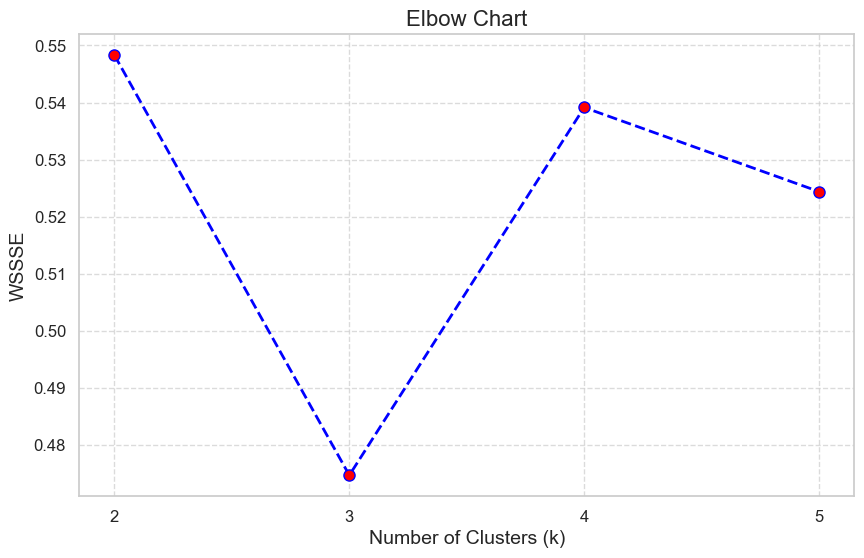

In [13]:
# Define the range of k values
k_values = list(range(2, 6))

# Calculate WSSSE (Within Set Sum of Squared Errors) for different values of k
wssse_list = airbnb_clustering.calculate_wssse(data_with_features, k_values)

# Plot the elbow chart
airbnb_clustering.plot_elbow_chart(k_values, wssse_list)

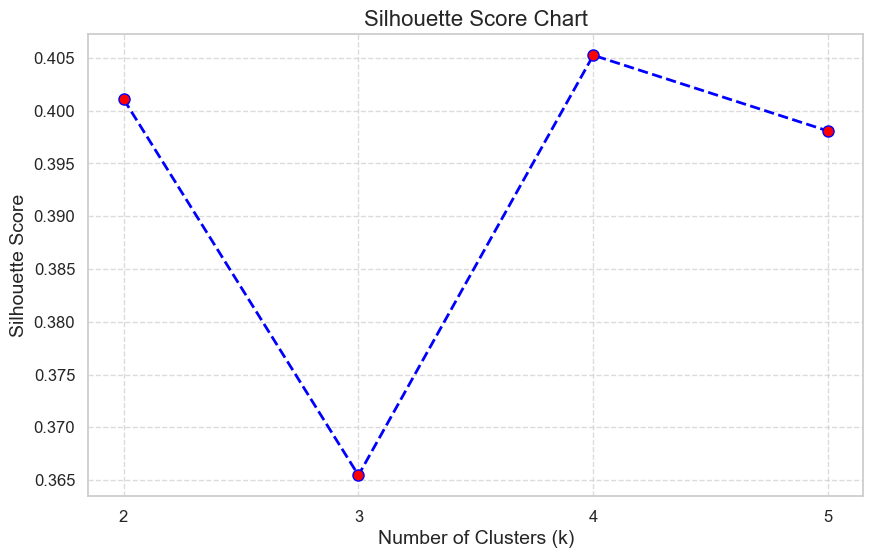

In [14]:
# Calculate silhouette scores
silhouette_scores = airbnb_clustering.calculate_silhouette_scores(data_with_features, k_values)

# Call the function to plot the Silhouette Score Chart
airbnb_clustering.plot_silhouette_score_chart(k_values, silhouette_scores)

# 2.4.3 <a id='2.4.3'> Cluster </a>
[Table of contents](#0.1)

In [15]:
# Identify the optimal number of clusters from the elbow chart
optimal_k = 3  # Adjust this value based on the elbow chart

# Train a KMeans model with the optimal k value
kmeans_model = airbnb_clustering.train_kmeans_model(data_with_features, optimal_k)

# Assign data points to clusters
clustered_data = airbnb_clustering.assign_clusters(kmeans_model, data_with_features)
clustered_data.show()

+--------+---------+--------------------+----------+
|latitude|longitude|            features|prediction|
+--------+---------+--------------------+----------+
|40.64749|-73.97237|[40.6474914550781...|         0|
|40.75362|-73.98377|[40.7536201477050...|         1|
|40.80902| -73.9419|[40.8090209960937...|         2|
|40.68514|-73.95976|[40.6851387023925...|         0|
|40.79851|-73.94399|[40.7985115051269...|         2|
|40.74767|  -73.975|[40.7476692199707...|         1|
|40.68688|-73.95596|[40.6868782043457...|         0|
|40.76489|-73.98493|[40.7648887634277...|         1|
|40.80178|-73.96723|[40.8017807006835...|         2|
|40.71344|-73.99037|[40.7134399414062...|         1|
|40.80316|-73.96545|[40.8031616210937...|         2|
|40.76076|-73.98867|[40.7607612609863...|         1|
|40.66829|-73.98779|[40.6682891845703...|         1|
|40.79826|-73.96113|[40.7982597351074...|         2|
| 40.7353|-74.00525|[40.7352981567382...|         1|
|40.70837|-73.95352|[40.7083702087402...|     

# 2.4.4 <a id='2.4.4'> Data Visualization </a>
[Table of contents](#0.1)

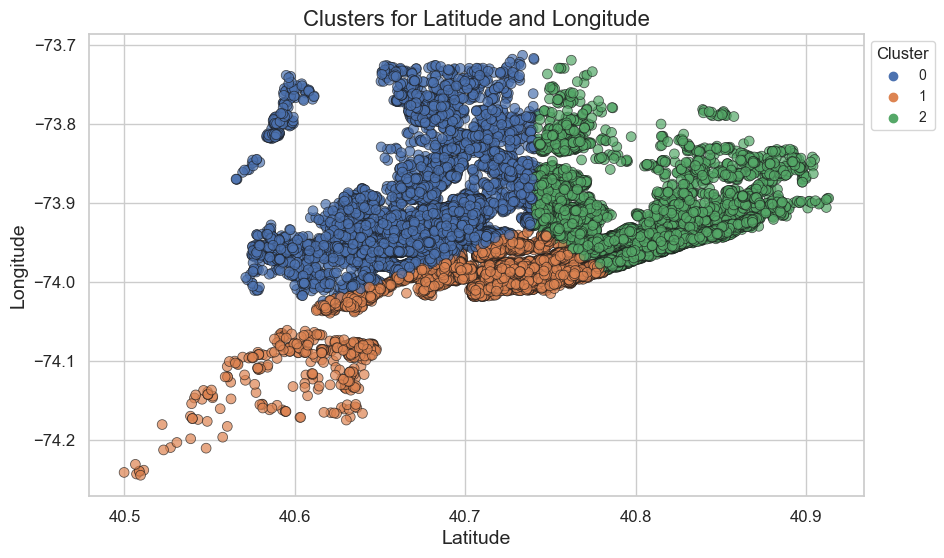

In [16]:
# Visualize the clusters using the 'latitude' and 'longitude' columns
airbnb_clustering.visualize_clusters(clustered_data, "latitude", "longitude", "prediction")

In [23]:
# Visualize the clusters on a map using the 'latitude' and 'longitude' columns
airbnb_clustering.visualize_clusters_mapbox(clustered_data, "latitude", "longitude", "prediction", mapbox_access_token)

<img src="https://www.vectorlogo.zone/logos/linkedin/linkedin-tile.svg" align='left' alt="plotly" width="60" height="60"/> </a><a> 
## [Msc. Diego Hurtado](https://www.linkedin.com/in/diegohurtadoo/)
    

<img src="https://www.vectorlogo.zone/logos/github/github-tile.svg" align='left' alt="plotly" width="60" height="60"/> </a><a> 
## [Msc. Diego Hurtado](https://github.com/DiegoHurtad0)


    
    
    
<img src="https://www.vectorlogo.zone/logos/medium/medium-tile.svg" align='left' alt="plotly" width="60" height="60"/> </a><a> 
## [Msc. Diego O’HURTADO](https://medium.com/@diego.hurtado.olivares)

<img src="https://raw.githubusercontent.com/DiegoHurtad0/Covid-19-Dataset-Mexico/master/wave.svg" width="900" height="600">

## [Msc. Diego Hurtado](https://www.linkedin.com/in/diegohurtadoo/)

## “When you are asked if you can do a job, tell ’em, ‘Certainly I can!’ Then get busy and find out how to do it.” — Theodore Roosevelt.